# Movie Genres Prediction

Dataset used: https://www.kaggle.com/datasets/akshaypawar7/millions-of-movies

In this project, we will develop a machine learning model to predict the _genres_ of a movie based on the followind features:

* __Original_language__: The language of the movie
* __Overview__: Brief explanation of the movie, Implemented using Bag of Words
* __Popularity__: A number which rapresent the popularity of the movie
* __Production_companies__: A string of companiens which produced the movie
* __Release_date__: When the movie was released
* __Budget__: int
* __Revenue__: int
* __Runtime__: int
* __Vote_average__: Average of votes
* __Vote_count__: Amount of votes
* __Credits__: Cast
* __Keywords__: Some keywords which describe the movie

# Code

First we import the necessary libraries, the cell _below_ needs to be run in case of error with the loading of _nltk.stopwords_

In [1]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/pietrosaveri/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
import re
import warnings
import itertools
import string
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from nltk.tokenize import word_tokenize
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords 
from nltk.stem import PorterStemmer 

from collections import Counter

import missingno as msno

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import (f1_score, roc_auc_score, precision_score, recall_score, 
                             matthews_corrcoef, accuracy_score, roc_curve, precision_recall_curve, 
                             confusion_matrix)
from sklearn.model_selection import (learning_curve, validation_curve, train_test_split, KFold, 
                                     StratifiedKFold, cross_val_score, GridSearchCV, RandomizedSearchCV, 
                                     cross_validate, RepeatedStratifiedKFold)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import (StandardScaler, OneHotEncoder, MinMaxScaler)
from sklearn.datasets import fetch_openml
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from imblearn.pipeline import Pipeline as IMBPipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import ConfusionMatrixDisplay

stemmer = PorterStemmer()
stop_words = set(stopwords.words('english')) 
warnings.simplefilter("ignore")


/var/folders/x6/3ljkq6l9301fxqkpg3n51z5h0000gn/T/ipykernel_1120/2308695170.py:5: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# Reading Dataset

First we have to read our dataset, using padas.

In [3]:
df_clean = pd.read_csv('movies.csv')

Let's look at the first 5 rows to have a better understanding of what we are dealing with

In [4]:
df_clean.head()

,id,title,genres,original_language,overview,popularity,production_companies,release_date,budget,revenue,runtime,status,tagline,vote_average,vote_count,credits,keywords,poster_path,backdrop_path,recommendations
0,615656,Meg 2: The Trench,Action-Science Fiction-Horror,en,An exploratory dive into the deepest depths of...,8763.998,Apelles Entertainment-Warner Bros. Pictures-di...,2023-08-02,129000000.0,352056482.0,116.0,Released,Back for seconds.,7.079,1365.0,Jason Statham-Wu Jing-Shuya Sophia Cai-Sergio ...,based on novel or book-sequel-kaiju,/4m1Au3YkjqsxF8iwQy0fPYSxE0h.jpg,/qlxy8yo5bcgUw2KAmmojUKp4rHd.jpg,1006462-298618-569094-1061181-346698-1076487-6...
1,758323,The Pope's Exorcist,Horror-Mystery-Thriller,en,Father Gabriele Amorth Chief Exorcist of the V...,5953.227,Screen Gems-2.0 Entertainment-Jesus & Mary-Wor...,2023-04-05,18000000.0,65675816.0,103.0,Released,Inspired by the actual files of Father Gabriel...,7.433,545.0,Russell Crowe-Daniel Zovatto-Alex Essoe-Franco...,spain-rome italy-vatican-pope-pig-possession-c...,/9JBEPLTPSm0d1mbEcLxULjJq9Eh.jpg,/hiHGRbyTcbZoLsYYkO4QiCLYe34.jpg,713704-296271-502356-1076605-1084225-1008005-9...
2,667538,Transformers: Rise of the Beasts,Action-Adventure-Science Fiction,en,When a new threat capable of destroying the en...,5409.104,Skydance-Paramount-di Bonaventura Pictures-Bay...,2023-06-06,200000000.0,407045464.0,127.0,Released,Unite or fall.,7.340,1007.0,Anthony Ramos-Dominique Fishback-Luna Lauren V...,peru-alien-end of the world-based on cartoon-b...,/gPbM0MK8CP8A174rmUwGsADNYKD.jpg,/woJbg7ZqidhpvqFGGMRhWQNoxwa.jpg,496450-569094-298618-385687-877100-598331-4628...
3,640146,Ant-Man and the Wasp: Quantumania,Action-Adventure-Science Fiction,en,Super-Hero partners Scott Lang and Hope van Dy...,4425.387,Marvel Studios-Kevin Feige Productions,2023-02-15,200000000.0,475766228.0,125.0,Released,Witness the beginning of a new dynasty.,6.507,2811.0,Paul Rudd-Evangeline Lilly-Jonathan Majors-Kat...,hero-ant-sequel-superhero-based on comic-famil...,/qnqGbB22YJ7dSs4o6M7exTpNxPz.jpg,/m8JTwHFwX7I7JY5fPe4SjqejWag.jpg,823999-676841-868759-734048-267805-965839-1033...
4,677179,Creed III,Drama-Action,en,After dominating the boxing world Adonis Creed...,3994.342,Metro-Goldwyn-Mayer-Proximity Media-Balboa Pro...,2023-03-01,75000000.0,269000000.0,116.0,Released,You can't run from your past.,7.262,1129.0,Michael B. Jordan-Tessa Thompson-Jonathan Majo...,philadelphia pennsylvania-husband wife relatio...,/cvsXj3I9Q2iyyIo95AecSd1tad7.jpg,/5i6SjyDbDWqyun8klUuCxrlFbyw.jpg,965839-267805-943822-842942-1035806-823999-107...


See how many missing values are in dataset, we could use the missigno matrix, to visulise it better. 

In [5]:
df_clean.isnull().sum()

id                           0
title                        6
genres                  210518
original_language            0
overview                118371
popularity                   0
production_companies    385248
release_date             51914
budget                       0
revenue                      0
runtime                  34374
status                       0
tagline                 614179
vote_average                 0
vote_count                   0
credits                 224889
keywords                512044
poster_path             184784
backdrop_path           499617
recommendations         687648
dtype: int64

As we can see there are no missing values in: 

* Vote_count
* Vout_average
* Budget
* Revenue

Since we are later going to drop all missing values in all categorical feature (it dosen't really make sense to impute those), let's add somke misisng values in the aboce column.

### Add mising values

In [6]:
def add_missing(col, amount):
    X = col.copy()
    size = amount if amount >= 1 else int(len(X) * amount)
    indexes = np.random.choice(len(X), size, replace = False )
    X[indexes] = np.nan
    return X

In [7]:
df_clean['budget'] = add_missing(df_clean['budget'], 0.08)
df_clean['revenue'] = add_missing(df_clean['revenue'], 0.03)
df_clean['vote_count'] = add_missing(df_clean['vote_count'], 0.06)
df_clean['vote_average'] = add_missing(df_clean['vote_average'], 0.05)

Now we can save the new corrupted dataset, and load it

In [8]:
df_clean.to_csv('movies_corr.csv')
df = pd.read_csv('movies_corr.csv')

# Preprocessing

First we look if there are duplicates and drop all the duplicates, we don't need them

In [9]:
df.drop_duplicates(inplace=True)

Then we drop all the missing values from the categorical features, i personally think it is not usefull to impute those.

In [10]:
df.dropna(subset=['genres', 'credits', 'keywords', 'production_companies', 'overview'], axis=0, inplace = True)

In [11]:
df.isnull().sum()

Unnamed: 0                   0
id                           0
title                        0
genres                       0
original_language            0
overview                     0
popularity                   0
production_companies         0
release_date               895
budget                   10481
revenue                   3966
runtime                    544
status                       0
tagline                  79754
vote_average              6454
vote_count                7834
credits                      0
keywords                     0
poster_path              10456
backdrop_path            44994
recommendations         106878
dtype: int64

We can now drop all the column we don't need which are: 

* Unnamed: 0
* id
* title
* status
* tagline
* poster_path
* backgound_path
* recommendations

In [12]:
df.drop(['Unnamed: 0', 'id', 'title', 'status', 'tagline', 'poster_path', 'backdrop_path', 'recommendations'], axis = 1, inplace = True)

In [13]:
df.isnull().sum(axis = 0)

genres                      0
original_language           0
overview                    0
popularity                  0
production_companies        0
release_date              895
budget                  10481
revenue                  3966
runtime                   544
vote_average             6454
vote_count               7834
credits                     0
keywords                    0
dtype: int64

### Setting up of Genres

As we can see, the genres, which is our target, are quite intersting. 
Most of them are in this form _Comedy-Mystery-Crime-Romance_, so a movie can be many genres.

To make this project a bit easier i decide to only consider the first genre for each movie. 

An interesting thing to do would be to create a model for genres prediction and then test that model with he original genres (_i.e_ _Comedy-Mystery-Crime-Romance_) and check if the prediction is one of those genres. So maybe the predicted genres was worong, but then when tested wtih the original genres it could be right.

In [14]:
df['genres'].value_counts()

genres
Drama                               17394
Documentary                         12741
Comedy                              10311
Horror                               3536
Music                                3004
                                    ...  
Fantasy-Mystery-Action                  1
TV Movie-Action-Western                 1
Comedy-Mystery-Crime-Romance            1
TV Movie-Animation-Comedy-Family        1
Animation-Crime-Action                  1
Name: count, Length: 7244, dtype: int64

In [15]:
df['genres'] = [i.split('-')[0] for i in df['genres']]

In [16]:
df['genres'].value_counts()

genres
Drama              33687
Comedy             21978
Documentary        16450
Action              9742
Horror              8075
Animation           5409
Music               4881
Crime               4491
Thriller            4454
Romance             3931
Adventure           3337
Western             2795
Science Fiction     2348
Family              2165
Fantasy             1699
Mystery             1556
TV Movie            1444
War                 1076
History              993
Name: count, dtype: int64

As we can see from this _value_counts()_ the classes are unbalacend, with the code below we will select 1000 values for each genres.

### Selecting 1000 instances for each genre

In [17]:
grouped_df = df.groupby('genres')

df_train = pd.DataFrame()
df_test = pd.DataFrame()

for genre, group_df in grouped_df:
    if len(group_df) >= 1000:
        train_sample = group_df.sample(n=1000, random_state=42)
        df_train = pd.concat([df_train, train_sample], axis=0)

        test_sample = group_df.drop(train_sample.index)
        df_test = pd.concat([df_test, test_sample], axis=0)
    else:
        # If the group has less than 1000 samples, include all samples in training set
        df_train = pd.concat([df_train, group_df], axis=0)

df = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)


In [18]:
df['genres'].value_counts()

genres
Action             1000
Adventure          1000
Animation          1000
Comedy             1000
Crime              1000
Documentary        1000
Drama              1000
Family             1000
Fantasy            1000
Horror             1000
Music              1000
TV Movie           1000
Mystery            1000
Romance            1000
Science Fiction    1000
War                1000
Thriller           1000
Western            1000
History             993
Name: count, dtype: int64

Now all the classes have 1000 instances (except for _History_ which did not have 1000 isinstance since the biginning)

### Selecting only month in the release date

We are going to select only the month of the release date, i believe it is the most relevand to predict the genres. 

For example, probabbly in february more romantic movies are produced beacuse of saint valentine.

In [19]:
df['release_date'].fillna('', inplace=True)
df['release_date'] = df['release_date'].apply(lambda x: x.split('-')[1] if '-' in x else x)

In [20]:
df.shape

(18993, 13)

### Are there any empty overviews?

Since we are going to work with overview, first we have to check if there are empty overviews, in thsi case the are none

In [21]:
empty_overview_count = (df['overview'] == '').sum()
empty_overview_count

0

# Data visualiation

Let's take a look at how the different genres are with respect to other features

In [22]:
df.head()

,genres,original_language,overview,popularity,production_companies,release_date,budget,revenue,runtime,vote_average,vote_count,credits,keywords
0,Action,te,All a full-time bank employee and part-time ka...,1.672,Srinivasaa Silver Screen,09,0.0,0.0,138.0,5.300,2.0,Gopichand-Tamanna Bhatia-Digangana Suryavanshi...,sports
1,Action,en,An ex-soldier a teen and a cop collide in New ...,17.113,Screen Arcade-Supermarché,08,0.0,0.0,113.0,6.502,2548.0,Jamie Foxx-Joseph Gordon-Levitt-Dominique Fish...,drugs-super power-force-pills
2,Action,en,Judgment Day (2005) was the seventh annual PPV...,2.564,World Wrestling Entertainment (WWE),05,0.0,0.0,180.0,7.000,5.0,John Cena-John Charles Layfield-Eddie Guerrero...,wrestling
3,Action,en,On the run in the year 1987 Bumblebee finds re...,40.543,Paramount-Di Bonaventura Pictures-Bay Films-To...,12,135000000.0,467989645.0,113.0,6.700,5312.0,Hailee Steinfeld-John Cena-Jorge Lendeborg Jr....,technology-based on toy-robot-spin off-1980s
4,Action,en,This film follows the further adventures of th...,2.180,The Rebel Corporation,04,0.0,0.0,78.0,4.800,3.0,Scott Shaw-Joe Estevez-Allison Chase-Don Strou...,roller blades-no script


### Is the target Balanced?

Thanks to the code provided before, we now have a balaned target and we show it

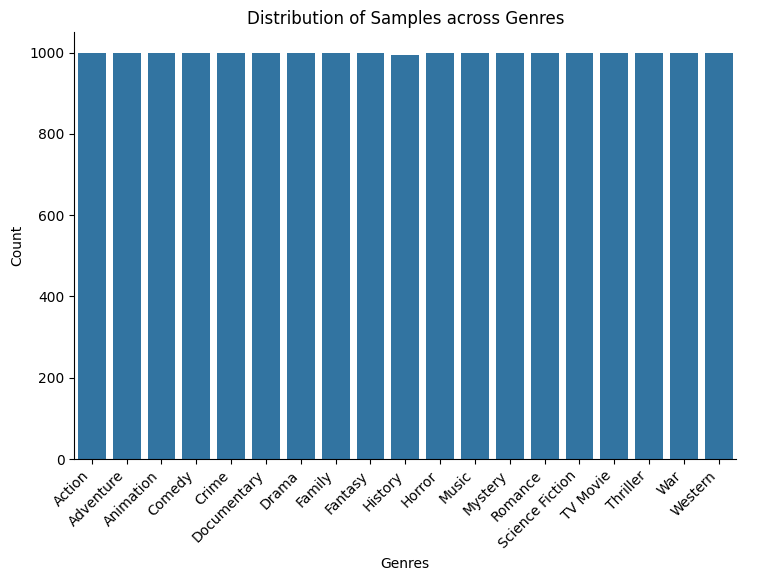

In [23]:
genre_order = df['genres'].unique()

histogram = sns.catplot(data=df, x='genres', kind="count", aspect=1.5, order=genre_order)
histogram.set_xticklabels(rotation=45, ha='right', labels=genre_order)
plt.title('Distribution of Samples across Genres')
plt.xlabel('Genres')
plt.ylabel('Count')
plt.show()


### Genre correlate with popularity and vote_average

How each _genre_ correlate with popularity and vote_average, we would expect an hight vote_average for the most popular genre but as we can see, the vote_averages are quite similar.

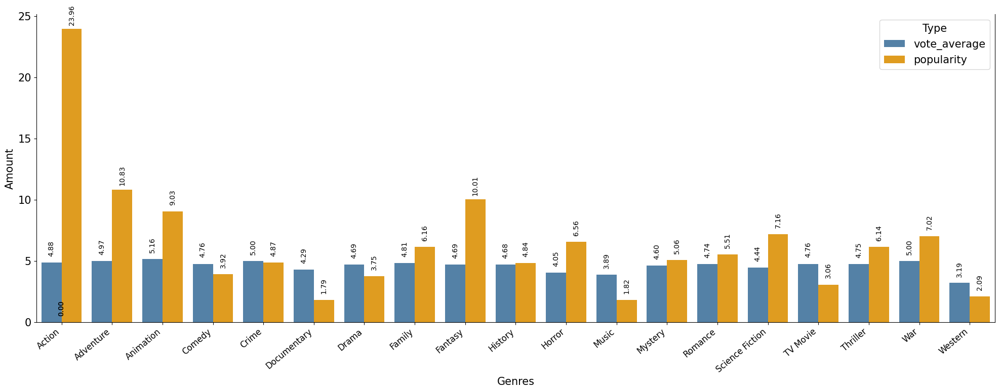

In [24]:
data_combined = pd.melt(df[['genres', 'vote_average', 'popularity']], id_vars='genres', var_name='type', value_name='amount')

plt.rcParams.update({'font.size': 15})

#Create the barplot
plt.figure(figsize=(20, 8))
ax = sns.barplot(x="genres", y='amount', hue='type', data=data_combined, ci=None, palette={"vote_average": 'steelblue' , "popularity": 'orange'})
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
ax.set_xlabel('Genres')
ax.set_ylabel('Amount')

#Add values as text annotations
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 20),
                textcoords='offset points', rotation=90)

ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.legend(title='Type', loc='upper right')
plt.show()


### Genre correlate with budget and revenue

How each _genre_ correlate with budget and revenue, as expected an high budget bring a high revenue.

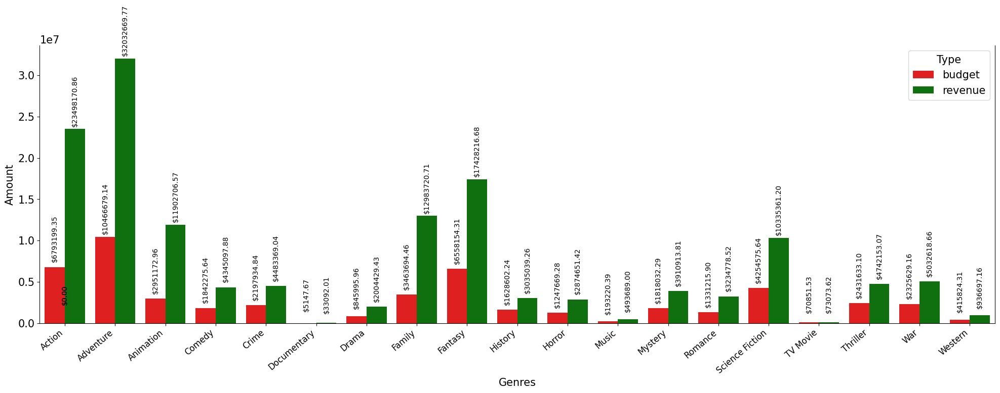

In [25]:
data_combined = pd.melt(df[['genres', 'budget', 'revenue']], id_vars='genres', var_name='type', value_name='amount')

plt.rcParams.update({'font.size': 15})

#Create the barplot
plt.figure(figsize=(20, 8))
ax = sns.barplot(x="genres", y='amount', hue='type', data=data_combined, ci=None, palette={"budget": 'red', "revenue": 'green'})
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right", fontsize=12)
ax.set_xlabel('Genres')
ax.set_ylabel('Amount')

#Add values as text annotations
for p in ax.patches:
    ax.annotate(f"${p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 40),
                textcoords='offset points', rotation=90)
 
ax.spines['top'].set_visible(False)
plt.tight_layout()
plt.legend(title='Type', loc='upper right')
plt.show()


# Visalisation of Overview

We can try to see how the most comon words of overview with respect to each genres.

We can show the top 20 most used words in the overview for each genre. 

To do this, we have to process the text.

- First we remove the punctuation and lower the text. 
    - Note: I had to introduce varius _special characters_ beacuse they were not present in the _string.punctuation_
- We Tokenaize the text, so from sentences we will get every single word as a token

- Now we can remove the stopwords, so all the words that do not tell us anything important.
    - Note: Also here i created a a list of custom _stopwords_ so that none of them would be included in the top 20

- We do not include stemming here, since the words will be plottent and stemmed words are hard to read


In [26]:
stop_words_custom = [
    'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", 
    "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 
    'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 
    'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 
    'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 
    'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 
    'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 
    'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 
    'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 
    'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 
    'same', 'so', 'than', 'too', 'very', 's', 't', 'can', 'will', 'just', 'don', "don't", 'should', 
    "should've", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'aren', "aren't", 'couldn', 
    "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', 
    "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn', "mustn't", 'needn', "needn't", 
    'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", 'won', "won't", 
    'wouldn', "wouldn't", "get", "new", "one", 'movie', 'film', 'story', 'plot', 'character', 'characters'
]

stop_words_custom = set(stop_words_custom)

#Concatenate stop_words and stop_words_custom
stop_words_tot = stop_words.union(stop_words_custom)

#Add addionatioal characters found during programming
additional_chars = {"’", "“", "”"}
chars_to_remove = string.punctuation + "".join(str(char) for char in additional_chars)


def remove_punctuation(text):
    text_toInsert = "".join([char for char in text if char not in chars_to_remove])
    return text_toInsert.lower()

def tokenize(text):
    text = word_tokenize(text)
    return text

def remove_stopwords(text):
    text = [word for word in text if word not in stop_words_tot]
    return text


def stemming(text):
    text = [stemmer.stem(word) for word in text]
    return text

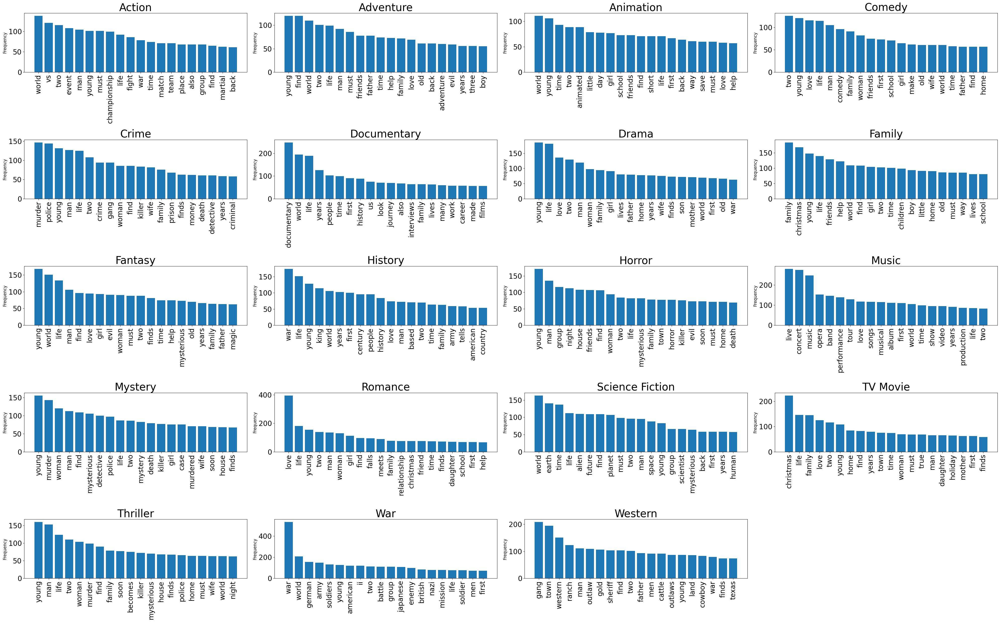

In [27]:
def process_text(text):
    text = remove_punctuation(text)
    text = tokenize(text)
    text = remove_stopwords(text)
    return text

grouped = df.groupby('genres')

#Number of top words to display in each histogram
top_n = 20

num_genres = len(grouped)
num_rows = (num_genres + 3) // 4 
fig, axes = plt.subplots(nrows=num_rows, ncols=4, figsize=(40, num_rows * 5)) 

axes = axes.flatten()


for i, (genre, group) in enumerate(grouped):
    if i >= len(axes):
        break
    overview_tokens = group['overview'].apply(process_text).sum()  # Apply process_text to each group
    word_freq = Counter(overview_tokens)
    top_words = dict(word_freq.most_common(top_n))
    #print("Genre:", genre)
    #print("Top 20 words:", top_words)
    #print()  
    ax = axes[i]
    ax.bar(top_words.keys(), top_words.values())
    ax.set_title(genre, fontsize = 30)
    ax.set_ylabel('Frequency', fontsize=12)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(axis='x', labelsize=20)
    ax.xaxis.set_tick_params(rotation=90)
    ax.grid(False)
    ax.grid(False)

#hide empty sublots if there are any
for i in range(num_genres, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


From this graphs we can see the top 20 most common words in overviews for each gengre.

It is interesntig to see how some genres share important words causing the model to have more difficulty in predicting them.

# Setting up keywords,credits and produciton companiens

As we saw before the keywords, credits and production companies are all strings devided by a '-'.

I personally think that the best way to process them is to do OneHoeEncoder on all of them but by spliting each at the '-' so that we can get a column for every keywords, production company and member of cast.

Obviusly this method will generate lots of columns, something around 311k columns.

We have to find a way to decrese the number since 311k are way to much to process during the next steps. 

We can drop all column which contain only one '1', it means that they only have one feature, meaning they don't really help us understand anything, so we can drop those. Remain with around 8700 columns whcih is more accetable.

In [28]:
encoded_key = pd.get_dummies(df['keywords'].str.split('-', expand=True), prefix='key')
encoded_credits = pd.get_dummies(df['credits'].str.split('-', expand=True), prefix='cred')
encoded_comp= pd.get_dummies(df['production_companies'].str.split('-', expand=True), prefix='comp')

edited = pd.concat([encoded_key, encoded_credits, encoded_comp], axis = 1)

print("Shape before: ", edited.shape)
column_sums = edited.sum()
columns_to_drop = column_sums[column_sums == 1].index
edited = edited.drop(columns=columns_to_drop)
print("Shape after: ", edited.shape)


df = pd.concat([df, edited], axis = 1)
df.drop(['keywords', 'credits', 'production_companies'], axis= 1, inplace = True)

Shape before:  (18993, 311874)
Shape after:  (18993, 8784)


As we can see the shape of the dataset is more resonable now

In [29]:
df.shape

(18993, 8794)

# Enhancing Computer Capabilities with a Sample Dataset Creation

Since I do not have a very powerfeull computer I have to create a sample of the dataset, selecting only 2000 rows. 

This is going to change the number of instances for each genre but it is necessary to run the code. 

If this code is runned on a more powerfull machine, then the next tow lines can be omitted.

In [30]:
df = df.sample(n=2000, random_state=42)
df.reset_index(drop=True, inplace=True)

In [31]:
df.shape

(2000, 8794)

### Still balanced?

Thanks to _value_counts()_ we can see that the target is still balanced

In [32]:
genres_value_counts = df['genres'].value_counts()
total_samples = len(df)
genres_proportions = genres_value_counts / total_samples

genres_proportions


genres
Family             0.0595
Horror             0.0585
Animation          0.0585
Drama              0.0565
Mystery            0.0550
Music              0.0545
Science Fiction    0.0535
Crime              0.0535
History            0.0530
Comedy             0.0530
Documentary        0.0525
Western            0.0525
Fantasy            0.0520
Romance            0.0520
Thriller           0.0515
War                0.0505
TV Movie           0.0490
Action             0.0440
Adventure          0.0405
Name: count, dtype: float64

In [33]:
df['genres'].value_counts()

genres
Family             119
Horror             117
Animation          117
Drama              113
Mystery            110
Music              109
Science Fiction    107
Crime              107
History            106
Comedy             106
Documentary        105
Western            105
Fantasy            104
Romance            104
Thriller           103
War                101
TV Movie            98
Action              88
Adventure           81
Name: count, dtype: int64

As we can see the target is still balanced

# Preprocessing

In [34]:
df.reset_index(drop=True, inplace=True)

### Custom ColumnTransformer to implement Bag of Words

Here we implement the Bag of Words in our custum Columntransformer to encode the overview.

We do the following steps:

- Remove Punctuation
    - Lower text
- Tokenize text
- Remove stopwords
- Stemming

- Select the top 40 words used in the overview for each genres
- Filter the original overview so that they only have the 40 most used words (coiche mostly made for coputational complexity)
- With the filtered overview, create a bag of words, creating a column for each word and impute '1' if there is one word in the overview of that row.

Basically if the sentences are:

__Sentence 1__: "So long, and thanks for all the fish"

__Sentence 2__: "Thank you, Mr. Miyagi."

The encoder will create a column for each word

|             | so | long | thanks | fish | mr | miyagi |
|-------------|----|------|--------|------|----|--------|
| Sentence 1  |  1  |   1   |   1     |   1    |  0   |    0     |
| Sentence 2  |  0  |   0   |   1     |   0    |  1   |    1     |





In [35]:
grouped = df.groupby('genres')

In [36]:
class BoW(BaseEstimator, TransformerMixin):
    def __init__(self, column):
        self.column = column
        self.vectorizer = None

    def fit(self, X, y=None):
        corpus = X[self.column].tolist()
        self.vectorizer = CountVectorizer()
        self.vectorizer.fit(corpus)
        return self
    
    def transform(self, X, y=None):
        X_copy = X.copy()  # Create a copy of the input X, to ensure we don't edit the actual df and later get a shape error
        
        def process_text(text):
            text = remove_punctuation(text)
            text = tokenize(text)
            text = remove_stopwords(text)
            text = stemming(text)
            return text
        
        def filter_overview(text):
            tokens = process_text(text)
            filtered_tokens = [token for token in tokens if token in all_words]
            return ' '.join(filtered_tokens)
        
        top_n = 40 #Select only the 40 most used words
        all_words = []

        for i, (genre, group) in enumerate(grouped):
            overview_tokens = group[self.column].apply(process_text).sum()
            word_freq = Counter(overview_tokens)
            top_words_genre = [word for word, freq in word_freq.most_common(top_n)]
            all_words.extend(top_words_genre)

        all_words = list(set(all_words))

        #Apply the filter function to the overview column
        X_copy[self.column] = X_copy[self.column].apply(filter_overview)
        corpus = X_copy[self.column].tolist()

        #Transform the corpus into a bag of words matrix
        data = self.vectorizer.transform(corpus)
        feature_names = self.vectorizer.get_feature_names_out()

        data_array = data.toarray()
        encoded = pd.DataFrame(data=data_array, columns=feature_names, index=corpus)

        #print('encoded', encoded.shape)
        #print('X', X.shape)

        #print('shape b', X_copy.shape)
        X_copy = X_copy.drop(columns=[self.column])
        X_copy = X_copy.join(encoded)
        #print('shape a', X_copy.shape)

        return encoded
    
    def fit_transform(self, X, y=None):
        return self.fit(X).transform(X)
    
    def get_feature_names_out(self, input_features=None):
        return self.vectorizer.get_feature_names_out(input_features)


### Defining The Pipelines

The pipelines are going to follow this scheme.

![Alt text](img/Pipelines-cropped.svg)

In [37]:
pipe_budget_revenue = Pipeline(
    [
        ('Mean',SimpleImputer(strategy='mean')),
        ('StandarScaler01', StandardScaler(with_mean = True))
    ]
)

pipe_votecount = Pipeline(
    [
        ('Median',SimpleImputer(strategy='median')),
        ('StandarScaler02', StandardScaler(with_mean = False))
    ]
)

pipe_voteaverage = Pipeline(
    [
        ('most_frequent',SimpleImputer(strategy='most_frequent')),
        ('MinMxax', MinMaxScaler())
    ]
)

pipe_runtime = Pipeline(
    [
        ('MostFrequent', SimpleImputer(strategy='most_frequent')),
        ('StandarScaler03', StandardScaler(with_mean = False)) 

    ]
)

pipe_overview = Pipeline(
    [
        ('text', BoW(column='overview'))
    ])



trf = ColumnTransformer(
    transformers = [
        ('budget_revenue', pipe_budget_revenue, ['budget', 'revenue']),
        ('voteCount', pipe_votecount, ['vote_count']),
        ('vote_average', pipe_voteaverage, ['vote_average']),
        ('runtime', pipe_runtime, ['runtime']),
        ('original_language', OneHotEncoder(categories='auto', handle_unknown='ignore'), ['original_language']),
        ('over', pipe_overview, ['overview'])

    ],
    sparse_threshold=0, #do not get a sparse matrix
    verbose_feature_names_out = True
)

# Algorithms

After all the preprocessing we can start to work on our model training part.

Devide features and target

In [38]:
X = df.drop(['genres'], axis=1)
y = df['genres'] #target

### Defining a first pipeline to test

We can start by defing a Pipeline to see if the fitting and testing work, i selected the TruncatedSVD and DecisionTreeClassifier just to try.

In [39]:
model_p = IMBPipeline(
    steps=[
        ('transformation', trf),
        ('sampler', None),
        ('dim_reduction', TruncatedSVD(n_components=100)),
        ('classifier', DecisionTreeClassifier())
    ],
    verbose=False  #Do not display all steps of the pipeline during processing
)


### Splitting train and test

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=30, shuffle=True)

In [41]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1600, 8793)
(400, 8793)
(1600,)
(400,)


### Sanity check

The pipeline is fitted correctly

In [42]:
model_p.fit(X_train, y_train) #9s

Pipeline(steps=[('transformation',
                 ColumnTransformer(sparse_threshold=0,
                                   transformers=[('budget_revenue',
                                                  Pipeline(steps=[('Mean',
                                                                   SimpleImputer()),
                                                                  ('StandarScaler01',
                                                                   StandardScaler())]),
                                                  ['budget', 'revenue']),
                                                 ('voteCount',
                                                  Pipeline(steps=[('Median',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('StandarScaler02',
                                                                   StandardScaler(with_mean=False))]),
                                                  ['vote_count']),
                                                 ('...
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('StandarScaler03',
                                                                   StandardScaler(with_mean=False))]),
                                                  ['runtime']),
                                                 ('original_language',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['original_language']),
                                                 ('over',
                                                  Pipeline(steps=[('text',
                                                                   BoW(column='overview'))]),
                                                  ['overview'])])),
                ('sampler', None),
                ('dim_reduction', TruncatedSVD(n_components=100)),
                ('classifier', DecisionTreeClassifier())])

### Does it work?

We can try to predict the genres on X_text to see if the fitting worked

In [43]:
model_p.predict(X_test)

array(['Mystery', 'Horror', 'Mystery', 'Action', 'War', 'Fantasy',
       'Horror', 'TV Movie', 'Adventure', 'Western', 'Mystery',
       'TV Movie', 'History', 'Family', 'Thriller', 'Family', 'Comedy',
       'Documentary', 'Family', 'History', 'Animation', 'War', 'History',
       'Western', 'Action', 'Family', 'Western', 'Mystery', 'Thriller',
       'Crime', 'War', 'Western', 'Drama', 'Animation', 'Mystery',
       'Science Fiction', 'Thriller', 'Documentary', 'Thriller', 'War',
       'Adventure', 'Action', 'Mystery', 'Thriller', 'Mystery', 'Crime',
       'Comedy', 'Action', 'Fantasy', 'Mystery', 'War', 'Thriller',
       'History', 'Action', 'TV Movie', 'Science Fiction', 'Mystery',
       'Action', 'Drama', 'Fantasy', 'Adventure', 'Action', 'Western',
       'Crime', 'Fantasy', 'Comedy', 'Comedy', 'Horror', 'Animation',
       'Crime', 'Fantasy', 'Crime', 'Mystery', 'Documentary', 'Comedy',
       'War', 'TV Movie', 'History', 'TV Movie', 'Comedy', 'Crime',
       'Family', 'Ro

### Exploring more Scoring Methods for Improved Performance Evaluation

Since we are dong a multi-class classification, we can try different scoring methods. 

The code below tries four: 

* f1_micro
* f1_macro
* accuracy
* f1_weighted


After retriving the cross validation score for all of them, it will plot all them to visualize which is the best one.

[0.090625 0.096875 0.1      0.0875   0.0875  ]
[0.07263667 0.07909121 0.1179538  0.08759789 0.07936373]
[0.096875 0.090625 0.090625 0.103125 0.103125]
[0.08255066 0.09151324 0.07109196 0.08695033 0.10183418]


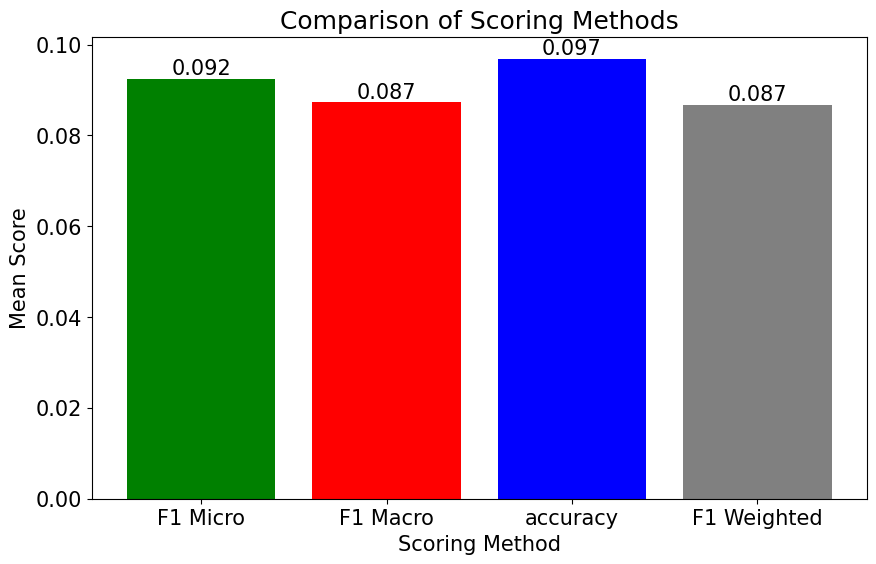

In [44]:
#3min
scores_micro = cross_val_score(model_p, X_train, y_train, cv=5, scoring='f1_micro')
scores_macro = cross_val_score(model_p, X_train, y_train, cv=5, scoring='f1_macro')
scores_accuracy = cross_val_score(model_p, X_train, y_train, cv=5, scoring='accuracy')
scores_weighted = cross_val_score(model_p, X_train, y_train, cv=5, scoring='f1_weighted')

print(scores_micro)
print(scores_macro)
print(scores_accuracy)
print(scores_weighted)

mean_scores_micro = np.mean(scores_micro)
mean_scores_macro = np.mean(scores_macro)
mean_scores_accuracy = np.mean(scores_accuracy)
mean_scores_f1 = np.mean(scores_weighted)

methods = ['F1 Micro', 'F1 Macro', 'accuracy', 'F1 Weighted']
scores = [mean_scores_micro, mean_scores_macro, mean_scores_accuracy, mean_scores_f1]


plt.figure(figsize=(10, 6))
bars = plt.bar(methods, scores, color=['green', 'red', 'blue', 'gray'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 3), ha='center', va='bottom')

plt.title('Comparison of Scoring Methods')
plt.xlabel('Scoring Method')
plt.ylabel('Mean Score')
plt.show()

### Selecting the best scoring method from now on

We can assign to the variable _best_scorer_ the best soring method, and from now on it will automatically select the best one.

In [45]:
mean_scores = {
    'f1_micro': mean_scores_micro,
    'f1_macro': mean_scores_macro,
    'accuracy': mean_scores_accuracy,
    'f1_weighted': mean_scores_f1
}

# Find the scoring method with the best mean score and save it in avariable to use it later
best_scorer = max(mean_scores, key=mean_scores.get)
best_scorer

'accuracy'

### Evaluate the performance of model on test set

In [46]:
model_p.score(X_test, y_test)

0.09

# Exploring different combinations

We will try the following compinations.

I decided to not inlcude a Sampler since we a __balanced__ multi-class classification.

In [47]:
sampler_conf = [
    {
        'sampler': [None]
    }
]

dim_reduction_configs = [
    {
        'dim_reduction': [None]
    },
    {
        'dim_reduction': [TruncatedSVD()],
        'dim_reduction__n_components': [5, 50, 100]
    },
    {
        'dim_reduction': [PCA()],
        'dim_reduction__n_components': [5, 50, 100]
    },

    {
        'dim_reduction': [TSNE()],
        'dim_reduction__n_components': [2, 3]
    },
    {
    'dim_reduction': [LinearDiscriminantAnalysis()],
    'dim_reduction__n_components': [5, 50, 100]
    }
]

estimator_configs = [
    {
        'classifier': [LinearSVC()],
        'classifier__C': [0.1, 1, 10]
    },
    {
        'classifier': [KNeighborsClassifier()],
        'classifier__n_neighbors': [3,5,7,9]
    },
    {
        'classifier' : [RandomForestClassifier()],
        'classifier__n_estimators' : [10,50,100, 500]
    },
    {
        'classifier': [OneVsOneClassifier(LinearSVC())],
        'classifier__estimator__C': [0.1, 1.0, 10.0]
    },
    {
        'classifier': [OneVsRestClassifier(LinearSVC())],
        'classifier__estimator__C': [0.1, 1.0, 10.0]
    }
]

In [48]:
all_configs = [dict(itertools.chain(*(e.items() for e in configuration))) for configuration in itertools.product(sampler_conf, dim_reduction_configs, estimator_configs)]

### How many ccombinations are possbile?

In [49]:
f'Number of all possible configurations: {len(all_configs)}'

'Number of all possible configurations: 25'

In [50]:
all_configs[:2]

[{'sampler': [None],
  'dim_reduction': [None],
  'classifier': [LinearSVC()],
  'classifier__C': [0.1, 1, 10]},
 {'sampler': [None],
  'dim_reduction': [None],
  'classifier': [KNeighborsClassifier()],
  'classifier__n_neighbors': [3, 5, 7, 9]}]

### Hyperparameter tuning

We create a RandomizedSearchCV to test all configuations using also cross validation

In [51]:
rs= RandomizedSearchCV(model_p,
    param_distributions= all_configs,
    n_iter=len(all_configs) * 5,
    n_jobs=-1,
    cv = 2,
    scoring= best_scorer
)

### Cross validation

We will get the best 5 combinations

In [52]:
scores = cross_validate(rs, X_train, y_train, scoring = best_scorer, cv=5, return_estimator=True, verbose=3) #49 min

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto

[CV] END ......................................., score=0.269 total time= 9.3min


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iter

[CV] END ......................................., score=0.237 total time= 7.9min


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto

[CV] END ......................................., score=0.216 total time= 8.4min


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the w

[CV] END ......................................., score=0.256 total time= 9.0min


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/V

[CV] END ......................................., score=0.256 total time= 9.2min


### Best 5 configurations

In [53]:
for index, estimator in enumerate(scores['estimator']):
    print(estimator.best_estimator_.get_params()['sampler'])
    print(estimator.best_estimator_.get_params()['dim_reduction'])
    print(estimator.best_estimator_.get_params()['classifier'],estimator.best_estimator_.get_params()['classifier'].get_params())
    print(scores['test_score'][index])
    print('-'*20)

None
None
RandomForestClassifier(n_estimators=500) {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 500, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
0.26875
--------------------
None
None
LinearSVC(C=0.1) {'C': 0.1, 'class_weight': None, 'dual': 'warn', 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': None, 'tol': 0.0001, 'verbose': 0}
0.2375
--------------------
None
None
LinearSVC(C=0.1) {'C': 0.1, 'class_weight': None, 'dual': 'warn', 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state':

Since the _best_scorer_ we created before is a string, we have to check which one of the 4 is to print the score on training and testing.

In this way to code can do everything automatically.

In [54]:
from sklearn.metrics import accuracy_score

for estimator in scores['estimator']:
    pred_train = estimator.best_estimator_.fit(X_train, y_train).predict(X_train)
    pred_test = estimator.best_estimator_.predict(X_test)

    if best_scorer == 'accuracy':
        accuracy_train = accuracy_score(y_train, pred_train)
        accuracy_test = accuracy_score(y_test, pred_test)

        print(f'Accuracy on training set: {accuracy_train:.4f}, Accuracy on test set: {accuracy_test:.4f}')

    if best_scorer == 'f1_micro':

        f1_micro_train = f1_score(y_train, pred_train, average = 'micro')
        f1_micro_test = f1_score(y_test, pred_test, average = 'micro')

        print(f'F1_micro on training set: {f1_micro_train:.4f}, F1_micro on test set: {f1_micro_test:.4f}')

    if best_scorer == 'f1_macro':

        f1_macro_train = f1_score(y_train, pred_train, average = 'macro')
        f1_macro_test = f1_score(y_test, pred_test, average = 'macro')

        print(f'f1_macro on training set: {f1_macro_train:.4f}, f1_macro on test set: {f1_macro_test:.4f}')

    if best_scorer == 'f1_weighted':

        f1_weighted_train = f1_score(y_train, pred_train, average = 'weighted')
        f1_weighted_test = f1_score(y_test, pred_test, average = 'weighted')

        print(f'f1_Weighted on training set: {f1_weighted_train:.4f}, f1_Weighted on test set: {f1_weighted_test:.4f}')


Accuracy on training set: 0.9994, Accuracy on test set: 0.2550
Accuracy on training set: 0.6038, Accuracy on test set: 0.2600
Accuracy on training set: 0.6038, Accuracy on test set: 0.2600
Accuracy on training set: 0.9994, Accuracy on test set: 0.2500
Accuracy on training set: 0.6038, Accuracy on test set: 0.2600


# Best model Selection

### Visualization of the 5 best configurations

A good way to evaluate all the 5 best configurations is to print the _classification_report_ for each one on them and confront them.

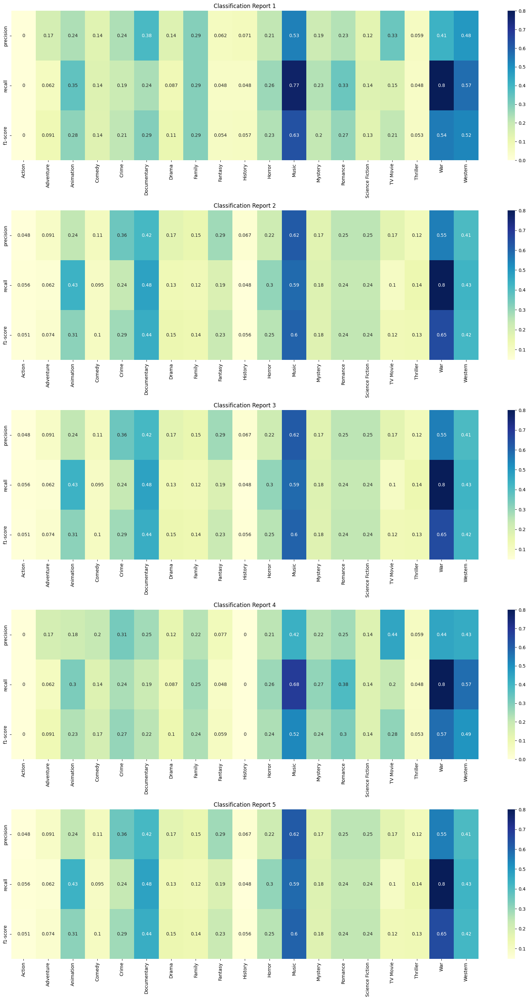

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

#Function to plot classification report as heatmap
def plot_classification_report(report_df, ax, index):
    sns.heatmap(report_df.iloc[:-3, :-1].T, annot=True, cmap="YlGnBu", ax=ax)
    ax.set_title(f'Classification Report {index + 1}')

fig, axes = plt.subplots(len(scores['estimator']), 1, figsize=(18, 6*len(scores['estimator'])))

for i, estimator in enumerate(scores['estimator']):
    y_pred = estimator.predict(X_test)
    
    #Classification Report
    class_report = classification_report(y_test, y_pred, output_dict=True)
    report_df = pd.DataFrame(class_report).transpose()
    plot_classification_report(report_df, axes[i], i)

plt.tight_layout()
plt.show()

After this, to visualise it even more, we can create a histogram showing the precision, recal, and accuracy of each estimator. 

The green one rapresent the best one.

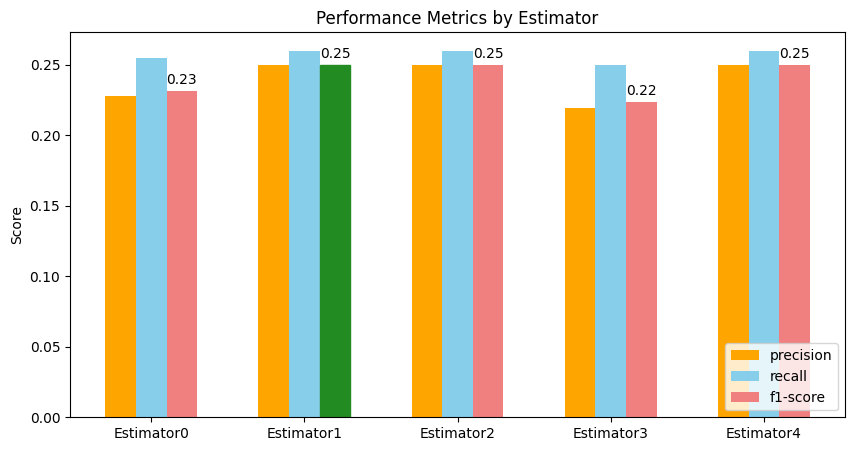

In [56]:
metrics = ['precision', 'recall', 'f1-score']

# Initialize lists to store metric scores for each estimator
metric_scores = {metric: [] for metric in metrics}
plt.style.use('default')

# Calculate metric scores for each estimator and store them
for estimator in scores['estimator']:
    report = classification_report(y_test, estimator.predict(X_test), output_dict=True)
    for metric in metrics:
        metric_scores[metric].append(report['weighted avg'][metric])

# Find the index of the best performing estimator
best_estimator_index = np.argmax(metric_scores['f1-score'])

colors = ['orange', 'skyblue', 'lightcoral', 'khaki']

# Plot the grouped bar plot
labels = ['Estimator{}'.format(i) for i in range(len(scores['estimator']))]
x = np.arange(len(labels))
width = 0.2

fig, ax = plt.subplots(figsize=(10, 5))


for i, metric in enumerate(metrics):
    bars = ax.bar(x + width * i, metric_scores[metric], width, label=metric, color=colors[i])
    ax.legend(loc = 'lower right')

    if i == len(metrics) - 1:  # If it's the last iteration (f1-score)
        bars[best_estimator_index].set_color('forestgreen')  # Set color to green for the best performing estimator
        for bar in bars:
            height = bar.get_height()
            ax.annotate('{}'.format(round(height, 2)),
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', color='black')
            

ax.set_ylabel('Score')
ax.set_title('Performance Metrics by Estimator')
ax.set_xticks(x + width * (len(metrics) - 1) / 2)
ax.set_xticklabels(labels)

plt.show()


### Selecting of best configuaration

Now that we know the best configuration we can train our model using that, so we define a new pipeline and use the best configuration.

In [57]:
best_model_pipeline = IMBPipeline([
    ('trans', trf),
    ('dim_reduction', None),
    ('classifier', RandomForestClassifier(n_estimators=500))
])

### Setting hyperparameters values

In [64]:
params = {'classifier__bootstrap': [True, False],
          'classifier__ccp_alpha': [0.0],
          'classifier__criterion': ['gini', 'entropy'],
          'classifier__max_depth': [None, 30, 50, 100],
          'classifier__max_features': ['auto', 'sqrt'],
          'classifier__min_samples_leaf': [1, 2],
          'classifier__min_samples_split': [5, 10],
          'classifier__n_estimators': [100, 500, 1000, 1400],
          'classifier__random_state': [42]
}

### Hyperparameter tuning

In [65]:
rs_best = RandomizedSearchCV(
    estimator = best_model_pipeline,
    param_distributions = params,
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3),
    n_iter=20,
    scoring= best_scorer
)

In [ ]:
rs_best.fit(X_train, y_train) #accidentaly cleared the output

### Showing best estimator

In [67]:
rs_best.best_estimator_

Pipeline(steps=[('trans',
                 ColumnTransformer(sparse_threshold=0,
                                   transformers=[('budget_revenue',
                                                  Pipeline(steps=[('Mean',
                                                                   SimpleImputer()),
                                                                  ('StandarScaler01',
                                                                   StandardScaler())]),
                                                  ['budget', 'revenue']),
                                                 ('voteCount',
                                                  Pipeline(steps=[('Median',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('StandarScaler02',
                                                                   StandardScaler(with_mean=False))]),
                                                  ['vote_count']),
                                                 ('vote_aver...
                                                                  ('StandarScaler03',
                                                                   StandardScaler(with_mean=False))]),
                                                  ['runtime']),
                                                 ('original_language',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['original_language']),
                                                 ('over',
                                                  Pipeline(steps=[('text',
                                                                   BoW(column='overview'))]),
                                                  ['overview'])])),
                ('dim_reduction', None),
                ('classifier',
                 RandomForestClassifier(bootstrap=False, max_depth=30,
                                        min_samples_split=5,
                                        n_estimators=1000))])

The code can automatically select the best scorer and gives us the score of our model

In [68]:
if best_scorer == 'accuracy':
    print(accuracy_score(y_test, rs_best.best_estimator_.predict(X_test)))

if best_scorer == 'f1_micro':
    print(f1_score(y_test, rs_best.best_estimator_.predict(X_test), average = 'micro'))

if best_scorer == 'f1_macro':
    print(f1_score(y_test, rs_best.best_estimator_.predict(X_test), average = 'macro'))

if best_scorer == 'f1_weighted':
    print(f1_score(y_test, rs_best.best_estimator_.predict(X_test), average = 'weighted'))

0.275


### Confusiuon matrix

The confusion matrix can be usefull to evaluate the performace of the model.

It provides a summary of the model predictions compared to the actual oucomes across different classes.

In [69]:
cls = rs_best.best_estimator_

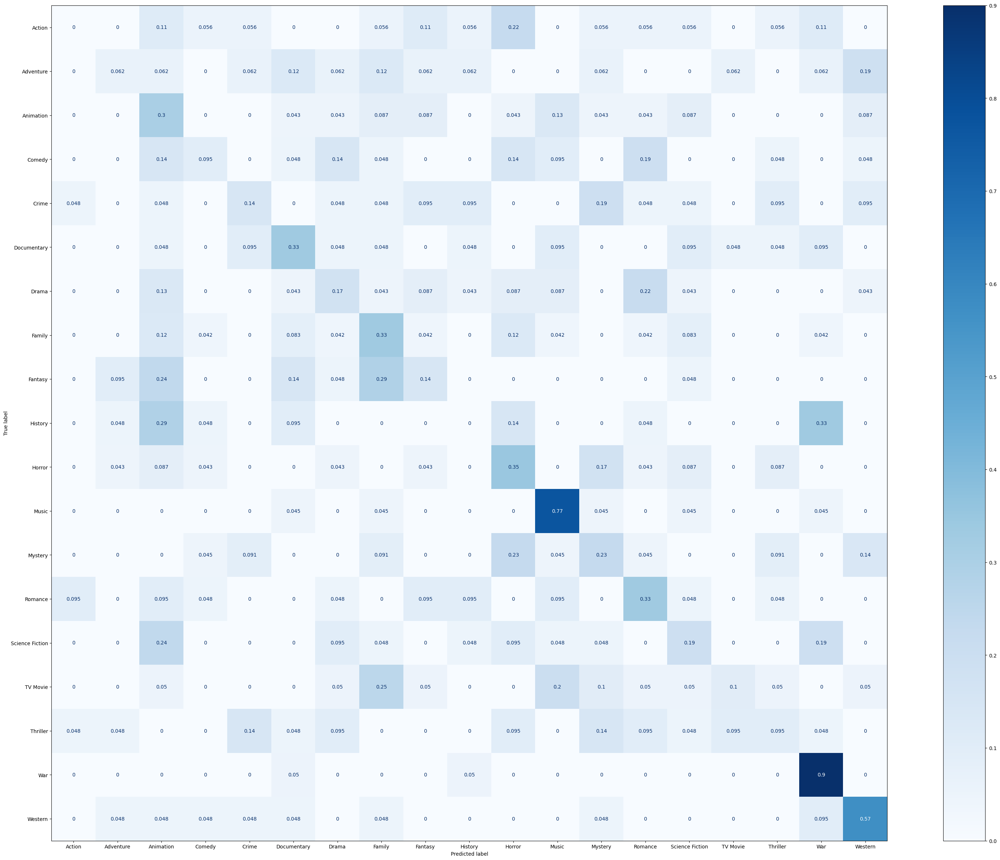

In [70]:
fig, ax = plt.subplots(figsize=(40, 30))
cm_display = ConfusionMatrixDisplay.from_estimator(cls, X_test, y_test, normalize='true', ax=ax, cmap='Blues')
plt.show()

# Plot Learning Curve

With the learning curve we can understand how the model performed and detect overfitting or underfitting 

In [ ]:
train_sizes, train_scores, test_scores = learning_curve(cls,
                                                       X=X_train,
                                                       y=y_train,
                                                       train_sizes= [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
                                                       cv = 5,
                                                       n_jobs = -1,
                                                       scoring = best_scorer,
                                                       shuffle = False)

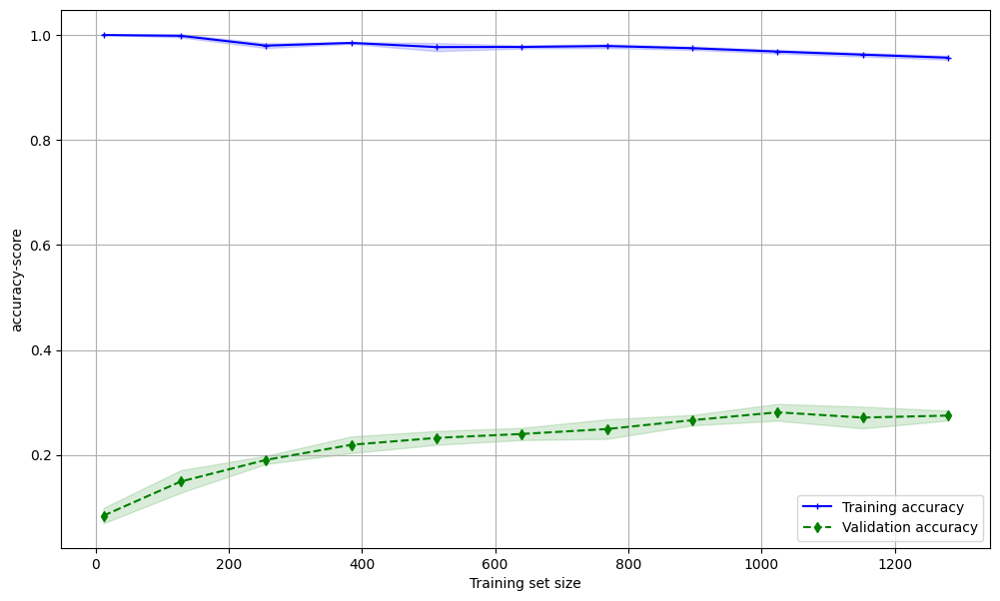

In [72]:
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()

ax.plot(train_sizes, train_mean,
         color='blue', marker='+',
         markersize=5, label='Training accuracy')

ax.fill_between(train_sizes,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(train_sizes, test_mean,
         color='green', linestyle='--',
         marker='d', markersize=5,
         label='Validation accuracy')

ax.fill_between(train_sizes,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.grid()
ax.set_xlabel('Training set size')
ax.set_ylabel('accuracy-score')
ax.legend(loc='lower right')

* __Training Accuracy Above Validation Accuracy__: As we can see initally, the model is able to fit the training data quite well, so we have a higher training accuracy compared to the validation accuracy. This suggests that the model is actually learning from the training data.

* __Gradual Decrease in Training Accuracy__: As the model complexity increases or training progresses, the model starts to fit the noise in the training data, causing the training accuracy to decrease. This means that the model is becoming less able to generalize to unseen data.

* __Gradual Increase in Validation Accuracy__: Initially, the model might not be generalizing well to unseen data, resulting in a low validation accuracy. However, as the model learns, it starts to generalize better, leading to an increase in validation accuracy over time.

* __Convergence of Training and Validation Curves__: The two accuracies are converging, it means that if we would add more data, they could eventually converge more, resulting in a higher score.

# Plot Validation Curve

Visualize how the changes in hyperparameters affect the model

In [79]:
range_n_estimators = [10, 50, 100, 500, 1000, 1400]
train_scores, test_scores = validation_curve(
    cls,
    X_train,
    y_train,
    param_name='classifier__n_estimators',
    param_range=range_n_estimators,
    cv=5,
    n_jobs=-1
)

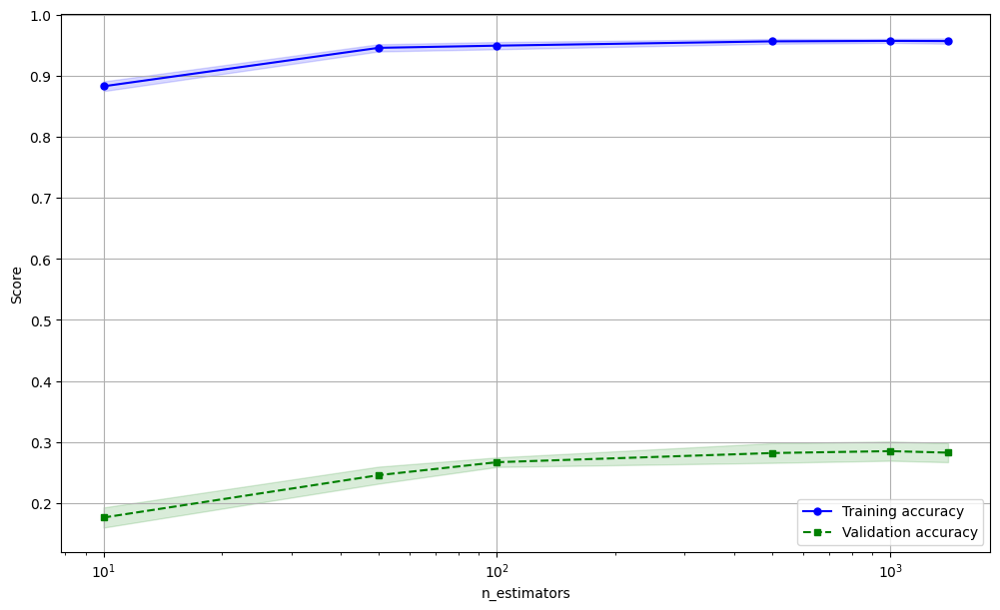

In [80]:
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

fig=plt.figure(figsize=(12,7))
ax = fig.add_subplot()
ax.plot(range_n_estimators, train_mean,
         color='blue', marker='o',
         markersize=5, label='Training accuracy')

ax.fill_between(range_n_estimators,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

ax.plot(range_n_estimators, test_mean,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='Validation accuracy')

ax.fill_between(range_n_estimators,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

ax.grid()
ax.set_xlabel('n_estimators')
ax.set_ylabel('Score')
ax.legend(loc='lower right')
ax.set_xscale('log')
ax.grid(True)
plt.show()


The stabilization of both training and validation accuracy at certain levels indicates that the model has reached its learning capacity with the given set of features and parameters. The model has learned as much as it can from the data, but it's still not enough to improve the performance significantly.

# Possible implementation

Since the Dataset I used is daily updated, a possibile and interesting implementation would be to test the model with the new updated data. It would also be interesting to predict the genre but check it using the full genres list (_E.g: horror-drama-romantic_) and see if the predicted genre is part of it.

### Example

__Movie_1__ genres in original dataset: _Drama-Horror-Comedy_

__Movie_1__ genre in edited dataset: _Drama_

Predicted genres for __Movie_1__: _Comedy_

So the __prediction__ was wrong for the _edited dataset_ but for the original dataset was __right__ because was part of the _Genres list_.